# South African Language Identification Hack 2022 Student Solution

© Explore Data Science Academy

---
### Honour Code

I **Thepe**, **Mashala**, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the EDSA honour code (https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### EXPLORE Data Science Academy Classification Hackathon

South Africa is a multicultural society that is characterised by its rich linguistic diversity. Language is an indispensable tool that can be used to deepen democracy and also contribute to the social, cultural, intellectual, economic and political life of the South African society.

The country is multilingual with 11 official languages, each of which is guaranteed equal status. Most South Africans are multilingual and able to speak at least two or more of the official languages.

__The task__: _In this challenge, you will take text which is in any of South Africa's 11 Official languages and identify which language the text is in. This is an example of NLP's Language Identification, the task of determining the natural language that a piece of text is written in._

__The significance__: _With such a multilingual population, it is only obvious that our systems and devices also communicate in multi-languages._

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

<a href=#eight>8. Conclusion</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [71]:
# Libraries for data loading, data manipulation and data visualisation

import seaborn as sns
from PIL import Image
from scipy import stats
import matplotlib.pyplot as plt
from nltk.probability import FreqDist
from sklearn.metrics import plot_roc_curve, f1_score, roc_auc_score, accuracy_score, confusion_matrix, classification_report
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
from scikitplot.metrics import plot_roc, plot_confusion_matrix
import plotly.express as px
%matplotlib inline

# imports for Natural Language  Processing
import pandas as pd
import numpy as np
import nltk
import string
import re
from sklearn.pipeline import Pipeline
import pickle


# feature extraction
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer 

# Preprocessing
#import contractions
from collections import Counter
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split

# downloads
#!pip install parfit
!pip install scikit-plot
!pip install yellowbrick
!pip install wordcloud
!pip install plotly
!pip install xgboost
#!pip install contractions


# classification models
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
#from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

import yellowbrick
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC

# Hyperparameter tunning methods
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid

import parfit as pf


<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

The training and testing data are loadedd. A copy of the dataframe is kept for preprocessing

In [3]:
# Importing the train & test data sets
df_train = pd.read_csv('train_set.csv')
df_test = pd.read_csv('test_set.csv')
pd.options.display.max_colwidth = 200

Have a look at the data

In [4]:
df_train.head(20)

,lang_id,text
0,xho,umgaqo-siseko wenza amalungiselelo kumaziko axhasa ulawulo lwesininzi kunye nokuthath inxaxheba kwabafazi ezi ziquka phakathi kwezinye zazo ikomishoni yokulingana ngokwesini ikomishoni yamalungelo...
1,xho,i-dha iya kuba nobulumko bokubeka umsebenzi naphi na kwisebe ngokusekwe kwiimfuno zokusebenza zalo emva kokubonana nomsebenzi kunye okanye imanyano yakhe ukuba ulandulo lomntu onjalo alufanelekang...
2,eng,the province of kwazulu-natal department of transport invites tenders from established contractors experienced in bridge construction for the construction of the kwajolwayo tugela river pedestrian...
3,nso,o netefatša gore o ba file dilo ka moka tše le dumelelanego ka tšona mohlala maleri a magolo a a šomišwago go fihlelela meagong e metelele scaffolds a a bolokegilego lefelo la maleba la go šomela ...
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana u ya nga mulayo wa khomishini ya ndinganyiso ya mbeu u thetshelesa mbilaelo dzine dza tshimbilelana na tshialula u ya nga mbeu nahone i ivhea sa fora...
5,nso,dinyakišišo tše tša go dirwa gabedi ka ngwaga di tla lebelela diphetogo tša mebaraka ya mešomo le mekgwa ga mmogo le go thapiwa mešomong ka makaleng ao mešomo ao lego molaong le ao a sego molaong ...
6,tsn,kgetse nngwe le nngwe e e sa faposiwang mo tshekong go ya ka temana ya a e tshwanetse kwa ntle ga fa kgetse e tsholotswe kgotsa e fetiseditswe kwa kgotlatshekelo ya bana ya fetisediwa kwa kgotlats...
7,ven,mbadelo dze dza laelwa dzi do kwama mahatulele apo a khothe ya madzhisitirata lihoro line la si vhe na mulandu li do vha lone line la wana masheleni ngeno lihoro le la wanwa mulandu li tshi do vha...
8,nso,maloko a dikhuduthamaga a ikarabela mongwe le mongwe go tonakgolo le go thteramelao ya profense malebana le taolo ya dipotfolio tša bona mme maloko a mangwe ka moka a khuduthamaga le wona bjalo a ...
9,tsn,fa le dirisiwa lebone le tshwanetse go bontsha lesedi le le benyabenyang le le bogale jo bo dirang gore le kgone go bonwa ke motho yo o bonang sentle mo leseding le le tlwaelegileng mo sekgaleng s...


In [5]:
df_test.head()

,index,text
0,1,"Mmasepala, fa maemo a a kgethegileng a letlelela kgato eo."
1,2,Uzakwaziswa ngokufaneleko nakungafuneka eminye imitlolo engezelelako ukuqedelela ukutloliswa kwesibawo sakho.
2,3,Tshivhumbeo tshi fana na ngano dza vhathu.
3,4,Kube inja nelikati betingevakala kutsi titsini naticocisana.
4,5,Winste op buitelandse valuta.


<a id="three"></a>
## 3. Data Pre-processing
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


#### Identify Missing Values
Would be identifying and checking for missing values in both the train and test datasets.


In [6]:
#Cheching if there are missing values in the train datasetb
df_train.isna().sum()

lang_id    0
text       0
dtype: int64

In [7]:
#Checking if there are missing values in the test dataset
df_test.isna().sum()

index    0
text     0
dtype: int64

####  Part-of-Speech Tagging
To improve the performance of lemmatization, we need to find the part of speech for each word in our string. We created a part-of-speech tagging function. The function accepts a word, then returns the most common part of speech for that word.

In [8]:
# Part of Speech for modeling
# def POS(word):
#     """
#     This function gets the part of speech
#     """
#     pos_counts = Counter()
#     probable_part_of_speech = wordnet.synsets(word)
#     pos_counts["n"] = len([i for i in probable_part_of_speech if i.pos()=="n"])
#     pos_counts["v"] = len([i for i in probable_part_of_speech if i.pos()=="v"])
#     pos_counts["a"] = len([i for i in probable_part_of_speech if i.pos()=="a"])
#     pos_counts["r"] = len([i for i in probable_part_of_speech if i.pos()=="r"])
#     part_of_speech = pos_counts.most_common(1)[0][0]
#     return part_of_speech

##### Data Extraction

We would be removing unnecessary information

In [9]:
# def clean(df):
#   # Remove URLs
#   df['message'] = df['message'].str.replace('http\S+|www.\S+', '', case=False)
#   # Remove 'RT'
#   df['message'] = df['message'].str.replace('RT', '', case=False)

#   return df

In [10]:
# df_train = clean(df_train)
# df_test = clean(df_test)

In [11]:
# Clean 
def clean2(df):
    '''
    This function cleans the text by tokenizing, removing punctuation, 
    removing digits and removing 1 character tokens
    
    '''

    # tokenizing the text
    clean_text = df.apply(lambda row: nltk.word_tokenize(row['text']), axis=1) ## first we tokenize

    # remove punctuation
    clean_text = clean_text.apply(lambda x : [token for token in x if token not in string.punctuation])

    # removing digits from the text
    clean_text = clean_text.apply(lambda x: [token for token in x if token not in list(string.digits)])

    # lastly we remove all one character tokens
    clean_text = clean_text.apply(lambda x: [token for token in x if len(token) > 1])
    
    df['cleaned_text'] = clean_text
    
    return df

In [12]:
df_train = clean2(df_train)
df_test = clean2(df_test)

In [13]:
print(stopwords.fileids())

['arabic', 'azerbaijani', 'basque', 'bengali', 'catalan', 'chinese', 'danish', 'dutch', 'english', 'finnish', 'french', 'german', 'greek', 'hebrew', 'hinglish', 'hungarian', 'indonesian', 'italian', 'kazakh', 'nepali', 'norwegian', 'portuguese', 'romanian', 'russian', 'slovene', 'spanish', 'swedish', 'tajik', 'turkish']


##### Stopwords Removal
Stop word removal is one of the most commonly used preprocessing steps across different NLP applications. The idea is simply removing the words that occur commonly across all the documents in the corpus.


In [14]:
nltk.download('stopwords')

stop = stopwords.words('english')

def stop_words_cleaner(df):
  # Convert to lower case
  df['cleaned_text'] = df['cleaned_text'].apply(lambda x: [word.lower() for word in x])

  # Remove stopwords
  #df['no_stopwords'] = df['cleaned_text'].apply(lambda x: [item for item in x if item not in stop])

  return df

[nltk_data] Downloading package stopwords to /Users/thepe/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [15]:
df_train = stop_words_cleaner(df_train)
df_train.head()

,lang_id,text,cleaned_text
0,xho,umgaqo-siseko wenza amalungiselelo kumaziko axhasa ulawulo lwesininzi kunye nokuthath inxaxheba kwabafazi ezi ziquka phakathi kwezinye zazo ikomishoni yokulingana ngokwesini ikomishoni yamalungelo...,"[umgaqo-siseko, wenza, amalungiselelo, kumaziko, axhasa, ulawulo, lwesininzi, kunye, nokuthath, inxaxheba, kwabafazi, ezi, ziquka, phakathi, kwezinye, zazo, ikomishoni, yokulingana, ngokwesini, ik..."
1,xho,i-dha iya kuba nobulumko bokubeka umsebenzi naphi na kwisebe ngokusekwe kwiimfuno zokusebenza zalo emva kokubonana nomsebenzi kunye okanye imanyano yakhe ukuba ulandulo lomntu onjalo alufanelekang...,"[i-dha, iya, kuba, nobulumko, bokubeka, umsebenzi, naphi, na, kwisebe, ngokusekwe, kwiimfuno, zokusebenza, zalo, emva, kokubonana, nomsebenzi, kunye, okanye, imanyano, yakhe, ukuba, ulandulo, lomn..."
2,eng,the province of kwazulu-natal department of transport invites tenders from established contractors experienced in bridge construction for the construction of the kwajolwayo tugela river pedestrian...,"[the, province, of, kwazulu-natal, department, of, transport, invites, tenders, from, established, contractors, experienced, in, bridge, construction, for, the, construction, of, the, kwajolwayo, ..."
3,nso,o netefatša gore o ba file dilo ka moka tše le dumelelanego ka tšona mohlala maleri a magolo a a šomišwago go fihlelela meagong e metelele scaffolds a a bolokegilego lefelo la maleba la go šomela ...,"[netefatša, gore, ba, file, dilo, ka, moka, tše, le, dumelelanego, ka, tšona, mohlala, maleri, magolo, šomišwago, go, fihlelela, meagong, metelele, scaffolds, bolokegilego, lefelo, la, maleba, la,..."
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana u ya nga mulayo wa khomishini ya ndinganyiso ya mbeu u thetshelesa mbilaelo dzine dza tshimbilelana na tshialula u ya nga mbeu nahone i ivhea sa fora...,"[khomishini, ya, ndinganyiso, ya, mbeu, yo, ewa, maana, ya, nga, mulayo, wa, khomishini, ya, ndinganyiso, ya, mbeu, thetshelesa, mbilaelo, dzine, dza, tshimbilelana, na, tshialula, ya, nga, mbeu, ..."


In [16]:
df_test = stop_words_cleaner(df_test)
df_test.head()

,index,text,cleaned_text
0,1,"Mmasepala, fa maemo a a kgethegileng a letlelela kgato eo.","[mmasepala, fa, maemo, kgethegileng, letlelela, kgato, eo]"
1,2,Uzakwaziswa ngokufaneleko nakungafuneka eminye imitlolo engezelelako ukuqedelela ukutloliswa kwesibawo sakho.,"[uzakwaziswa, ngokufaneleko, nakungafuneka, eminye, imitlolo, engezelelako, ukuqedelela, ukutloliswa, kwesibawo, sakho]"
2,3,Tshivhumbeo tshi fana na ngano dza vhathu.,"[tshivhumbeo, tshi, fana, na, ngano, dza, vhathu]"
3,4,Kube inja nelikati betingevakala kutsi titsini naticocisana.,"[kube, inja, nelikati, betingevakala, kutsi, titsini, naticocisana]"
4,5,Winste op buitelandse valuta.,"[winste, op, buitelandse, valuta]"


In [17]:
#Highlight collection words Collection words are the words that you used to query your data from Twitter. In our case 'climatechange', 'climate', 'change' are the query words.
# def filter_word_cleaner(df):
#   filter_words = ['climatechange', 'climate', 'change']
#   df['no_filter_words'] = [[w for w in word if not w in filter_words]
#                  for word in df['no_stopwords']]
#   return df

In [18]:
# df_train = filter_word_cleaner(df_train)
# df_test = filter_word_cleaner(df_test)

Below are the messages after data cleaning

In [19]:
df_train.head()

,lang_id,text,cleaned_text
0,xho,umgaqo-siseko wenza amalungiselelo kumaziko axhasa ulawulo lwesininzi kunye nokuthath inxaxheba kwabafazi ezi ziquka phakathi kwezinye zazo ikomishoni yokulingana ngokwesini ikomishoni yamalungelo...,"[umgaqo-siseko, wenza, amalungiselelo, kumaziko, axhasa, ulawulo, lwesininzi, kunye, nokuthath, inxaxheba, kwabafazi, ezi, ziquka, phakathi, kwezinye, zazo, ikomishoni, yokulingana, ngokwesini, ik..."
1,xho,i-dha iya kuba nobulumko bokubeka umsebenzi naphi na kwisebe ngokusekwe kwiimfuno zokusebenza zalo emva kokubonana nomsebenzi kunye okanye imanyano yakhe ukuba ulandulo lomntu onjalo alufanelekang...,"[i-dha, iya, kuba, nobulumko, bokubeka, umsebenzi, naphi, na, kwisebe, ngokusekwe, kwiimfuno, zokusebenza, zalo, emva, kokubonana, nomsebenzi, kunye, okanye, imanyano, yakhe, ukuba, ulandulo, lomn..."
2,eng,the province of kwazulu-natal department of transport invites tenders from established contractors experienced in bridge construction for the construction of the kwajolwayo tugela river pedestrian...,"[the, province, of, kwazulu-natal, department, of, transport, invites, tenders, from, established, contractors, experienced, in, bridge, construction, for, the, construction, of, the, kwajolwayo, ..."
3,nso,o netefatša gore o ba file dilo ka moka tše le dumelelanego ka tšona mohlala maleri a magolo a a šomišwago go fihlelela meagong e metelele scaffolds a a bolokegilego lefelo la maleba la go šomela ...,"[netefatša, gore, ba, file, dilo, ka, moka, tše, le, dumelelanego, ka, tšona, mohlala, maleri, magolo, šomišwago, go, fihlelela, meagong, metelele, scaffolds, bolokegilego, lefelo, la, maleba, la,..."
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana u ya nga mulayo wa khomishini ya ndinganyiso ya mbeu u thetshelesa mbilaelo dzine dza tshimbilelana na tshialula u ya nga mbeu nahone i ivhea sa fora...,"[khomishini, ya, ndinganyiso, ya, mbeu, yo, ewa, maana, ya, nga, mulayo, wa, khomishini, ya, ndinganyiso, ya, mbeu, thetshelesa, mbilaelo, dzine, dza, tshimbilelana, na, tshialula, ya, nga, mbeu, ..."


In [20]:
df_test.head()
sorted(df_train['lang_id'].unique())

['afr', 'eng', 'nbl', 'nso', 'sot', 'ssw', 'tsn', 'tso', 'ven', 'xho', 'zul']

##### Map the Sentiments

In [21]:
df_train['lang_labels']  = df_train['lang_id'].map({'xho': 'isiXhosa','eng':'English', 'nso':'Sepedi', 'ven':'Tshivenda', 'tsn': 'Setswana','nbl':'isiNdebele', 'zul':'isiZulu', 'ssw':'siSwati','tso':'Xitsonga', 'sot':'Sesotho', 'afr':'Afrikaans'})

## 4. Exploratory Data Analysis

We would be applying techniques into getiing insights from the data.

##### Get length of text

We would be getting the length of the original and cleaned text

In [22]:
def text_length(text):
    str_len=len(text.split(" "))
    return(str_len)

In [23]:
df_train['original_text_length'] = df_train['text'].apply(lambda x: text_length(x))
df_train['new_text_length'] = df_train['cleaned_text'].apply(lambda x: len(x))
df_train.head(10)

,lang_id,text,cleaned_text,lang_labels,original_text_length,new_text_length
0,xho,umgaqo-siseko wenza amalungiselelo kumaziko axhasa ulawulo lwesininzi kunye nokuthath inxaxheba kwabafazi ezi ziquka phakathi kwezinye zazo ikomishoni yokulingana ngokwesini ikomishoni yamalungelo...,"[umgaqo-siseko, wenza, amalungiselelo, kumaziko, axhasa, ulawulo, lwesininzi, kunye, nokuthath, inxaxheba, kwabafazi, ezi, ziquka, phakathi, kwezinye, zazo, ikomishoni, yokulingana, ngokwesini, ik...",isiXhosa,24,24
1,xho,i-dha iya kuba nobulumko bokubeka umsebenzi naphi na kwisebe ngokusekwe kwiimfuno zokusebenza zalo emva kokubonana nomsebenzi kunye okanye imanyano yakhe ukuba ulandulo lomntu onjalo alufanelekang...,"[i-dha, iya, kuba, nobulumko, bokubeka, umsebenzi, naphi, na, kwisebe, ngokusekwe, kwiimfuno, zokusebenza, zalo, emva, kokubonana, nomsebenzi, kunye, okanye, imanyano, yakhe, ukuba, ulandulo, lomn...",isiXhosa,31,31
2,eng,the province of kwazulu-natal department of transport invites tenders from established contractors experienced in bridge construction for the construction of the kwajolwayo tugela river pedestrian...,"[the, province, of, kwazulu-natal, department, of, transport, invites, tenders, from, established, contractors, experienced, in, bridge, construction, for, the, construction, of, the, kwajolwayo, ...",English,37,37
3,nso,o netefatša gore o ba file dilo ka moka tše le dumelelanego ka tšona mohlala maleri a magolo a a šomišwago go fihlelela meagong e metelele scaffolds a a bolokegilego lefelo la maleba la go šomela ...,"[netefatša, gore, ba, file, dilo, ka, moka, tše, le, dumelelanego, ka, tšona, mohlala, maleri, magolo, šomišwago, go, fihlelela, meagong, metelele, scaffolds, bolokegilego, lefelo, la, maleba, la,...",Sepedi,40,32
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana u ya nga mulayo wa khomishini ya ndinganyiso ya mbeu u thetshelesa mbilaelo dzine dza tshimbilelana na tshialula u ya nga mbeu nahone i ivhea sa fora...,"[khomishini, ya, ndinganyiso, ya, mbeu, yo, ewa, maana, ya, nga, mulayo, wa, khomishini, ya, ndinganyiso, ya, mbeu, thetshelesa, mbilaelo, dzine, dza, tshimbilelana, na, tshialula, ya, nga, mbeu, ...",Tshivenda,43,38
5,nso,dinyakišišo tše tša go dirwa gabedi ka ngwaga di tla lebelela diphetogo tša mebaraka ya mešomo le mekgwa ga mmogo le go thapiwa mešomong ka makaleng ao mešomo ao lego molaong le ao a sego molaong ...,"[dinyakišišo, tše, tša, go, dirwa, gabedi, ka, ngwaga, di, tla, lebelela, diphetogo, tša, mebaraka, ya, mešomo, le, mekgwa, ga, mmogo, le, go, thapiwa, mešomong, ka, makaleng, ao, mešomo, ao, lego...",Sepedi,41,40
6,tsn,kgetse nngwe le nngwe e e sa faposiwang mo tshekong go ya ka temana ya a e tshwanetse kwa ntle ga fa kgetse e tsholotswe kgotsa e fetiseditswe kwa kgotlatshekelo ya bana ya fetisediwa kwa kgotlats...,"[kgetse, nngwe, le, nngwe, sa, faposiwang, mo, tshekong, go, ya, ka, temana, ya, tshwanetse, kwa, ntle, ga, fa, kgetse, tsholotswe, kgotsa, fetiseditswe, kwa, kgotlatshekelo, ya, bana, ya, fetised...",Setswana,55,48
7,ven,mbadelo dze dza laelwa dzi do kwama mahatulele apo a khothe ya madzhisitirata lihoro line la si vhe na mulandu li do vha lone line la wana masheleni ngeno lihoro le la wanwa mulandu li tshi do vha...,"[mbadelo, dze, dza, laelwa, dzi, do, kwama, mahatulele, apo, khothe, ya, madzhisitirata, lihoro, line, la, si, vhe, na, mulandu, li, do, vha, lone, line, la, wana, masheleni, ngeno, lihoro, le, la...",Tshivenda,50,47
8,nso,maloko a dikhuduthamaga a ikarabela mongwe le mongwe go tonakgolo le go thteramelao ya profense malebana le taolo ya dipotfolio tša bona mme maloko a mangwe ka moka a khuduthamaga le wona bjalo a ...,"[maloko, dikhuduthamaga, ikarabela, mongwe, le, mongwe, go, tonakgolo, le, go, thteramelao, ya, profense, malebana, le, taolo, ya, dipotfolio, tša, bona, mme, maloko, mangwe, ka, moka, khuduthamag...",Sepedi,51,46
9,tsn,fa le dirisiwa lebone le tshwanetse go bontsha lesedi le le benyabenyang le le bogale jo bo dirang gore le kgone go 

In [24]:
df_test['original_text_length'] = df_test['text'].apply(lambda x: text_length(x))
df_test['new_text_length'] = df_test['cleaned_text'].apply(lambda x: len(x))
df_test.head(10)

,index,text,cleaned_text,original_text_length,new_text_length
0,1,"Mmasepala, fa maemo a a kgethegileng a letlelela kgato eo.","[mmasepala, fa, maemo, kgethegileng, letlelela, kgato, eo]",10,7
1,2,Uzakwaziswa ngokufaneleko nakungafuneka eminye imitlolo engezelelako ukuqedelela ukutloliswa kwesibawo sakho.,"[uzakwaziswa, ngokufaneleko, nakungafuneka, eminye, imitlolo, engezelelako, ukuqedelela, ukutloliswa, kwesibawo, sakho]",10,10
2,3,Tshivhumbeo tshi fana na ngano dza vhathu.,"[tshivhumbeo, tshi, fana, na, ngano, dza, vhathu]",7,7
3,4,Kube inja nelikati betingevakala kutsi titsini naticocisana.,"[kube, inja, nelikati, betingevakala, kutsi, titsini, naticocisana]",7,7
4,5,Winste op buitelandse valuta.,"[winste, op, buitelandse, valuta]",4,4
5,6,"Ke feela dilense tše hlakilego, tša pono e tee goba tše pedi tšeo di lefelelwago. Kgetho ya diforeimo e a hwetšagala yeo maloko a ka kgethago go tšwa go yona. Ge o nyaka foreimo ya go bitša ga nny...","[ke, feela, dilense, tše, hlakilego, tša, pono, tee, goba, tše, pedi, tšeo, di, lefelelwago, kgetho, ya, diforeimo, hwetšagala, yeo, maloko, ka, kgethago, go, tšwa, go, yona, ge, nyaka, foreimo, y...",47,41
6,7,<fn>(762010101403 AM) 1495 Final Gems Birthing Options_ZULU.txt</fn>,"[fn, 762010101403, am, 1495, final, gems, birthing, options_zulu.txt, /fn]",7,9
7,8,Ntjhafatso ya konteraka ya mosebetsi: Etsa bonnete hore tsohle tse lokelwang ho ngolwa fatshe di entswe!,"[ntjhafatso, ya, konteraka, ya, mosebetsi, etsa, bonnete, hore, tsohle, tse, lokelwang, ho, ngolwa, fatshe, di, entswe]",16,16
8,9,"u-GEMS uhlinzeka ngezinzuzo zemithi yezifo ezingapheli kuwo wonke amalunga. ukuze ukwazi ukuthola imithi yezifo ezingapheli kufanele ubhalise ohlelweni lwemithi yezifo ezingapheli, emva kokuthola ...","[u-gems, uhlinzeka, ngezinzuzo, zemithi, yezifo, ezingapheli, kuwo, wonke, amalunga, ukuze, ukwazi, ukuthola, imithi, yezifo, ezingapheli, kufanele, ubhalise, ohlelweni, lwemithi, yezifo, ezingaph...",28,28
9,10,"So, on occasion, are statistics misused.","[so, on, occasion, are, statistics, misused]",6,6


##### Show Language Id Distribution

In [25]:
# Display target distribution
fig = px.pie(df_train, names='lang_labels',title="Language Id Distribution")
fig.show()

In [26]:
fig = px.box(df_train, x='lang_labels', y='original_text_length', title="Text Length Distribution Before Cleaning (Train)")
fig.show()

In [27]:
fig = px.box(df_train, x='lang_labels', y='new_text_length', title="Text Length Distirbution After Cleaning (Train)")
fig.show()

/Users/thepe/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/thepe/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



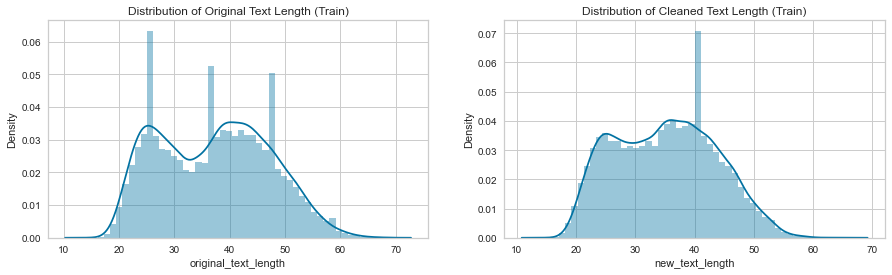

In [28]:
fig, axes = plt.subplots(1, 2, figsize = (15, 4))
sns.distplot(df_train['original_text_length'], ax = axes[0])
sns.distplot(df_train['new_text_length'], ax = axes[1])

axes[0].title.set_text("Distribution of Original Text Length (Train)")
axes[1].title.set_text("Distribution of Cleaned Text Length (Train)")

/Users/thepe/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/thepe/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



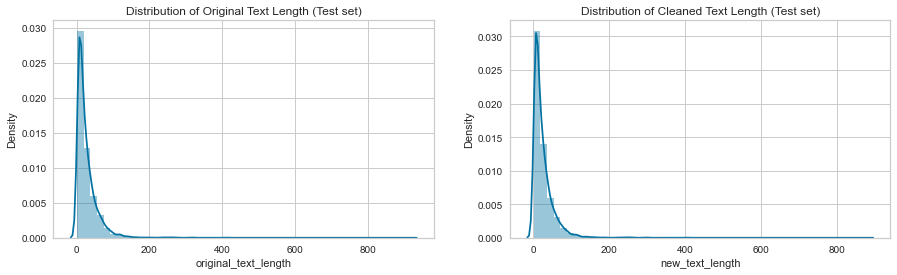

In [29]:
fig, axes = plt.subplots(1, 2, figsize = (15, 4))
sns.distplot(df_test['original_text_length'], ax = axes[0])
sns.distplot(df_test['new_text_length'], ax = axes[1])

axes[0].title.set_text("Distribution of Original Text Length (Test set)")
axes[1].title.set_text("Distribution of Cleaned Text Length (Test set)")

#### Visualisation of trending words used for different sentiment distribution

In [30]:
#### Visualizing data into wordclouds

def wordcount_gen(df, lang_id):
    '''
    Generating Word Cloud
    inputs:
       - df: text dataset
       - lang_labels: ['afr', 'eng', 'nbl', 'nso', 'sot', 'ssw', 'tsn', 'tso', 'ven', 'xho', 'zul']
    '''
    # Combine all text from the same language
    combined_texts = " ".join([tweet for tweet in df[df.lang_id==lang_id]['cleaned_text'].str.join(" ")])
                          
    # Initialize wordcloud object
    wc = WordCloud(background_color='grey', 
                   max_words=50)
#, stopwords = STOPWORDS
                   
    # Generate and plot wordcloud
    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_texts))
    plt.title('Top 50 {} Language Words'.format(lang_id), fontsize=20)
    plt.axis('off')
    plt.show()
    

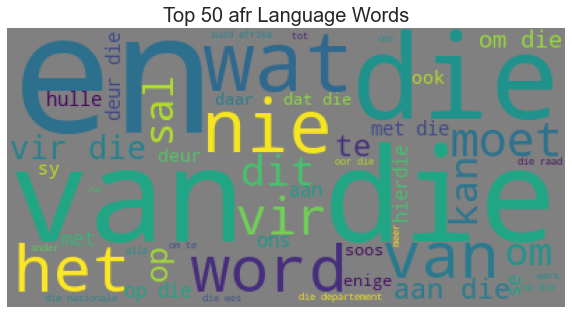

____________________________________________________________________________________________________


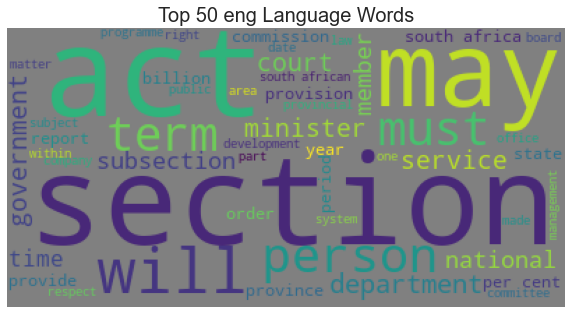

____________________________________________________________________________________________________


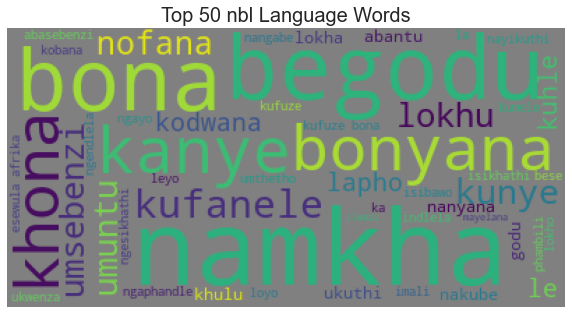

____________________________________________________________________________________________________


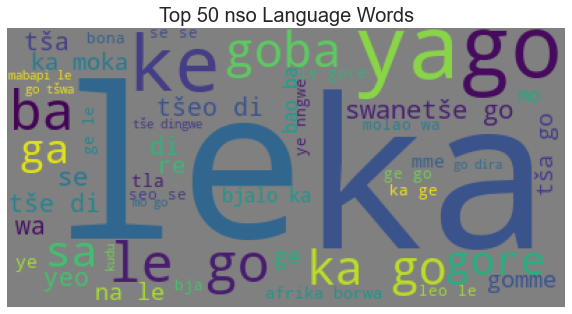

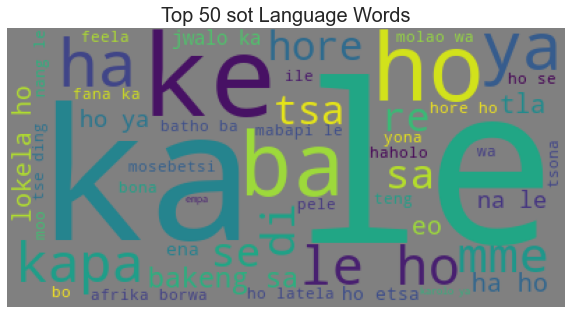

____________________________________________________________________________________________________


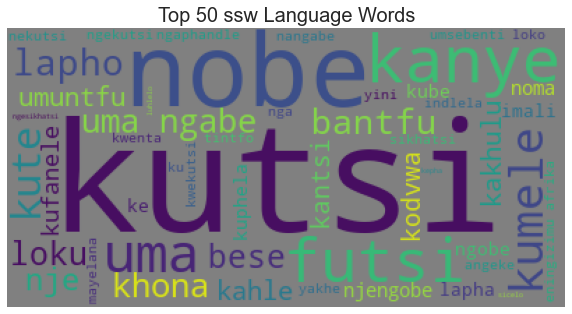

____________________________________________________________________________________________________


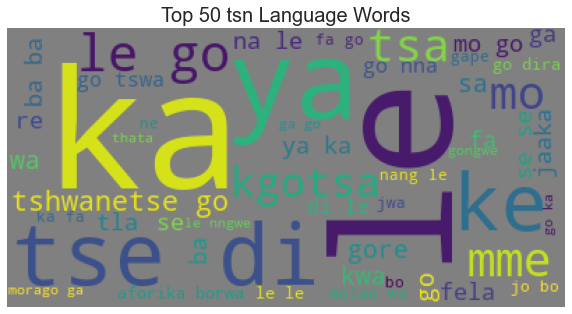

____________________________________________________________________________________________________


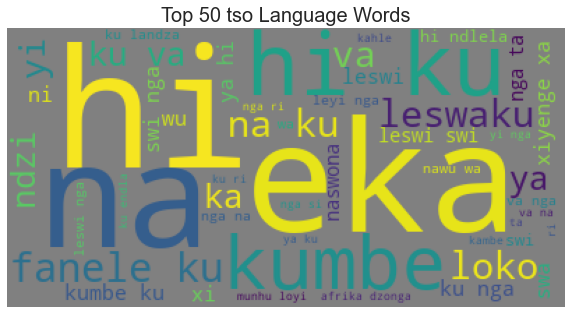

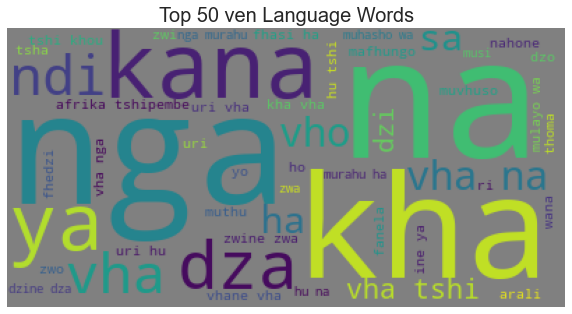

____________________________________________________________________________________________________


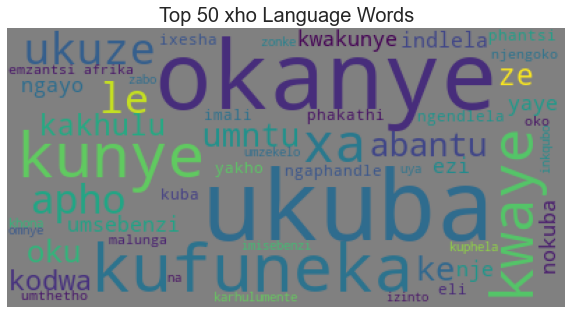

____________________________________________________________________________________________________


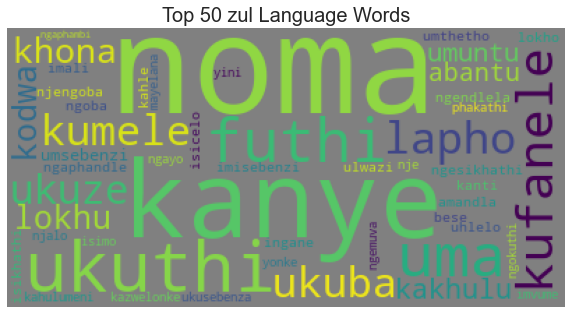

____________________________________________________________________________________________________


In [31]:
# afr text words
wordcount_gen(df_train, 'afr')
print("_"*100)   
# eng text words
wordcount_gen(df_train, 'eng')
print("_"*100)       
# nbl text words
wordcount_gen(df_train, 'nbl')
print("_"*100)   
# nso text words
wordcount_gen(df_train, 'nso')
# sot text words
wordcount_gen(df_train, 'sot')
print("_"*100)   
# ssw text words
wordcount_gen(df_train, 'ssw')
print("_"*100)       
# tsn text words
wordcount_gen(df_train, 'tsn')
print("_"*100)   
# tso text words
wordcount_gen(df_train, 'tso')
# ven text words
wordcount_gen(df_train, 'ven')
print("_"*100)   
# xho text words
wordcount_gen(df_train, 'xho')
print("_"*100)       
# zul text words
wordcount_gen(df_train, 'zul')
print("_"*100)   


## 5. Modelling

#### Underlisted models would be used:

Logistic Regression

K-Nearest Neighbors

Random Forest

XGBoost Classifier

### Pre-processing for Model

In [32]:
# def clean_tweets(df):
#     '''
#     This function cleans the tweets by tokenizing, removing punctuation, 
#     removing digits and removing 1 character tokens
    
#     '''

#     # tokenizing the tweets
#     clean_tweets = df['message'].apply(TweetTokenizer().tokenize) ## first we tokenize

#     # remove punctuation
#     clean_tweets = clean_tweets.apply(lambda x : [token for token in x if token not in string.punctuation])

#     # removing digits from the tweets
#     clean_tweets = clean_tweets.apply(lambda x: [token for token in x if token not in list(string.digits)])

#     # lastly we remove all one character tokens
#     clean_tweets = clean_tweets.apply(lambda x: [token for token in x if len(token) > 1])
    
#     df['cleaned_tweets'] = clean_tweets
    
#     return df['cleaned_tweets']

In [33]:
# # Data preprocessing for model building

# normalizer = WordNetLemmatizer()
# nltk.download('wordnet')
# nltk.download('omw-1.4')

# def replace_sentiments(df):
#     """
#     replace keywords in the tweets  with associated sentiments
    
#     'global' ----> 'negative'
#     'climate' ----> 'positive'
#     'MAGA'----> 'negative'
  
#     """
#     df['message'] = df['message'].apply(lambda x: x.replace('global', 'negative'))
#     df['message'] = df['message'].apply(lambda x: x.replace('climate', 'positive'))
#     df['message'] = df['message'].apply(lambda x: x.replace('MAGA', 'negative')) 

#     return df['message']

# df_train['message'] = replace_sentiments(df_train)
# df_test['message'] = replace_sentiments(df_test)

# # cleaning tweets
# df_train['clean_tweets'] = clean_tweets(df_train)
# df_test['clean_tweets'] = clean_tweets(df_test)


# # lemmatize
# df_train['clean_tweets'] = df_train['clean_tweets'].apply(lambda x: [normalizer.lemmatize(token, POS(token)) for token in x])
# df_test['clean_tweets'] = df_test['clean_tweets'].apply(lambda x: [normalizer.lemmatize(token, POS(token)) for token in x])

In [34]:
df_train.head()
df_train.shape

(33000, 6)

In [35]:
### Creating our X and Y 
X = df_train['cleaned_text']
y = df_train['lang_id']
X_test = df_test['cleaned_text']


In [36]:
# Splitting the data into 80% train and 20% validation set
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state = 50)

In [37]:
X_train = list(X_train.apply(' '.join))
X_val = list(X_val.apply(' '.join))
X_test = list(X_test.apply(' '.join))

#### Model Pre-processing

Since our models can only process numerical data our first step is to build a pipeline that converts text data into numeric data, In this notebook we will be focusing on two methods of feature engineering, which we will use to convert text data to numeric data, namely `TfidfVectorizer` and the `CountVectorizer`, then we will train our models within these pipelines

We would first checkout which to be used between CountVectorizer and TfidfVectorizer

#### Buidling Classification Pipelines

In order to decide which feature extraction method we will use between the TF-IDF and the CountVectorizer for the remainder of the notebook, we will build pipelines using both methods and check which approach has the highest accuracy on average

In [40]:
# Naive Bayes
# gnb = GaussianNB()
# gnb.fit(X_train, y_train)
# y_pred = gnb.predict(X_test)

# Logistic Regression pipeline
logreg_tfidf = Pipeline([('tfidf', TfidfVectorizer()),('logistic', LogisticRegression()),])
logreg_count = Pipeline([('CountVec',  CountVectorizer(analyzer = 'word', 
                             tokenizer = None, 
                             preprocessor = None, 
                             stop_words = None, 
                             max_features = 180000,
                             min_df = 1,
                             ngram_range = (1,2)
                            )),('logistic', LogisticRegression()),])

# KNN Pipeline
knn_tfidf = Pipeline([('tfidf', TfidfVectorizer()),
                     ('knn', KNeighborsClassifier()),])
knn_count = Pipeline([('CountVec',  CountVectorizer(analyzer = 'word', 
                             tokenizer = None, 
                             preprocessor = None, 
                             stop_words = None, 
                             max_features = 180000,
                             min_df = 1,
                             ngram_range = (1,2)
                            )),('knn', KNeighborsClassifier()),])

# Naive Bayes Pipeline
nb_tfidf = Pipeline([('tfidf', TfidfVectorizer()),('naive_bayes', GaussianNB()),])
nb_count = Pipeline([('CountVec',  CountVectorizer(analyzer = 'word', 
                             tokenizer = None, 
                             preprocessor = None, 
                             stop_words = None, 
                             max_features = 180000,
                             min_df = 1,
                             ngram_range = (1,2)
                            )),('naive_bayes', GaussianNB()),])

# RandomForestClassifier Pipeline
rfc_tfidf = Pipeline([('tfidf', TfidfVectorizer()), ('rfc', RandomForestClassifier())])
rfc_count = Pipeline([('CountVec',  CountVectorizer(analyzer = 'word', 
                             tokenizer = None, 
                             preprocessor = None, 
                             stop_words = None, 
                             max_features = 180000,
                             min_df = 1,
                             ngram_range = (1,2)
                            )),('rfc', RandomForestClassifier()),])

# XGBClassifier Pipeline 
# xgboost_tfidf = Pipeline([('tfidf', TfidfVectorizer()), ('xgboost', XGBClassifier())])
# xgboost_count = Pipeline([('CountVec',  CountVectorizer(analyzer = 'word', 
#                              tokenizer = None, 
#                              preprocessor = None, 
#                              stop_words = None, 
#                              max_features = 180000,
#                              min_df = 1,
#                              ngram_range = (1,2)
#                             )),('xgboost', XGBClassifier()),])

# LGBMClassifier Pipeline
# lightgbm_tfidf = Pipeline([('tfidf', TfidfVectorizer()), ('lightgbm', lgb.LGBMClassifier())])
# lightgbm_count = Pipeline([('CountVec',  CountVectorizer(analyzer = 'word', 
#                              tokenizer = None, 
#                              preprocessor = None, 
#                              stop_words = None, 
#                              max_features = 180000,
#                              min_df = 1,
#                              ngram_range = (1,2)
#                             )),('lightgbm', LGBMClassifier()),])

# LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
#                importance_type='split', learning_rate=0.1, max_depth=-1,
#                min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
#                n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
#                random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
#                subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

#### Model Training

Each model is trained using it's custom pipeline which will take raw text data turn it into numeric data and initial the classifier with default parameters

In [42]:
# training the LogisticRegression pipeline
logreg_tfidf.fit(X_train, y_train)
logreg_count.fit(X_train, y_train)

# training the KNeighborsClassifier
knn_tfidf.fit(X_train, y_train)
knn_count.fit(X_train, y_train)

# training the Naive Bayes
# nb_tfidf.fit(X_train.todense(), y_train)
# nb_count.fit(X_train.todense(), y_train)

# training the RandomForestClassifier pipleline
rfc_tfidf.fit(X_train, y_train)
rfc_count.fit(X_train, y_train)

# training the XGBClassifier pipeline
# xgboost_tfidf.fit(X_train, y_train)
# xgboost_count.fit(X_train, y_train)

# # training the LGBMClassifier
# lightgbm_tfidf.fit(X_train, y_train)
# lightgbm_count.fit(X_train, y_train)

Pipeline(steps=[('CountVec',
                 CountVectorizer(max_features=180000, ngram_range=(1, 2))),
                ('rfc', RandomForestClassifier())])

In [43]:
# calculating average scores for the TFIDF
logreg_acc =  accuracy_score(y_val,logreg_tfidf.predict(X_val))
knn_acc = accuracy_score(y_val,knn_tfidf.predict(X_val))
rfc_acc = accuracy_score(y_val,rfc_tfidf.predict(X_val))

tfidf_accuracy = [logreg_acc,knn_acc,rfc_acc]

In [44]:
# calculating average scores for the CountVectorizer
logreg_acc = accuracy_score(y_val, logreg_count.predict(X_val))
knn_acc =  accuracy_score(y_val,knn_count.predict(X_val))
rfc_acc = accuracy_score(y_val,rfc_count.predict(X_val))

countvec_accuracry = [logreg_acc,knn_acc,rfc_acc]


In [45]:
print(tfidf_accuracy)
print(countvec_accuracry)

[0.995, 0.9606060606060606, 0.9883333333333333]
[0.9942424242424243, 0.5578787878787879, 0.9887878787878788]


We see that on average  the models build using the `TFIDF` performed the best and for the remainder of this notebook we will generate our features using the `TFIDF`

In [46]:
TFIDF = pd.Series(tfidf_accuracy, index=["Logistic Regression", 'KNNeighbors Classifier', 'Random Forest Classifier'])
COUNT_VEC = pd.Series(countvec_accuracry, index=["Logistic Regression", 'KNNeighbors Classifier', 'Random Forest Classifier'])

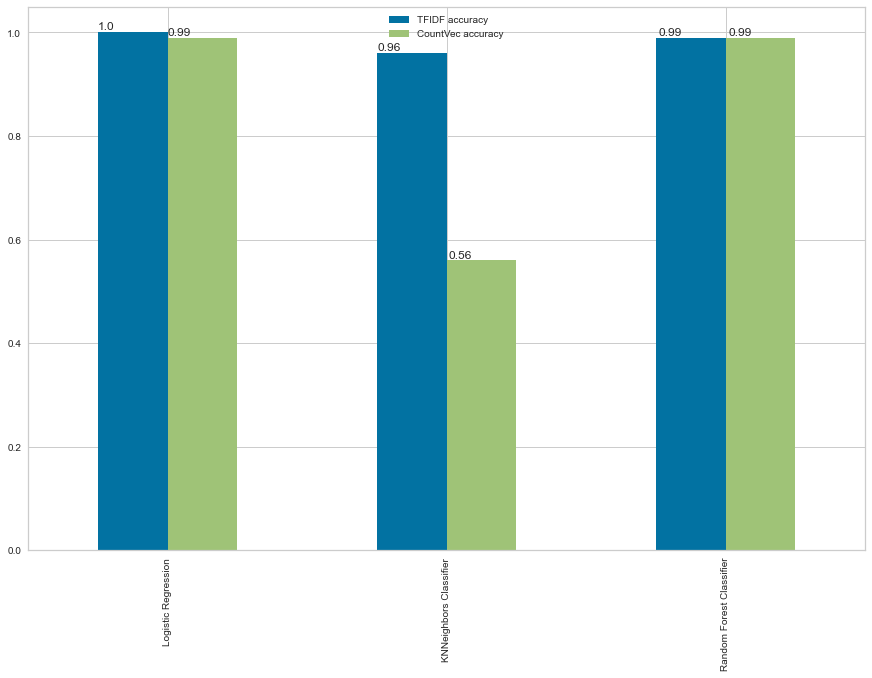

In [47]:
acc_df = pd.DataFrame()
acc_df["TFIDF accuracy"] = TFIDF
acc_df["CountVec accuracy"] = COUNT_VEC
accuracy_df = acc_df.round(2)
ax = accuracy_df.plot.bar(figsize=(15, 10))
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

From the visual above, we can conclude the TFIDF yields better features than Countvectorizer

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

The 3 top models are `Logistic Regression, Random Forest Classifier and Ridge Classifier` and they will be evaluated using a classification report and confusion matrix


In [48]:
# Print a classification report
logreg_prediction = logreg_tfidf.predict(X_val)
print('\nLogistic Regression\n', classification_report(y_val, logreg_prediction))


Logistic Regression
               precision    recall  f1-score   support

         afr       1.00      1.00      1.00       596
         eng       1.00      1.00      1.00       595
         nbl       0.99      0.98      0.98       594
         nso       1.00      0.99      1.00       581
         sot       1.00      1.00      1.00       600
         ssw       0.99      1.00      0.99       601
         tsn       1.00      1.00      1.00       609
         tso       1.00      1.00      1.00       606
         ven       1.00      1.00      1.00       614
         xho       0.98      1.00      0.99       606
         zul       0.98      0.98      0.98       598

    accuracy                           0.99      6600
   macro avg       1.00      0.99      0.99      6600
weighted avg       1.00      0.99      0.99      6600



In [50]:
# The classification report 
knn_prediction = knn_tfidf.predict(X_val)
print('\nKNeighbors Classifier  Classification report :\n', classification_report(y_val, knn_prediction))


KNeighbors Classifier  Classification report :
               precision    recall  f1-score   support

         afr       0.99      1.00      0.99       596
         eng       0.96      1.00      0.98       595
         nbl       0.89      0.95      0.92       594
         nso       0.93      0.98      0.96       581
         sot       0.96      0.98      0.97       600
         ssw       0.97      0.96      0.96       601
         tsn       0.97      0.93      0.95       609
         tso       0.99      1.00      0.99       606
         ven       0.99      1.00      1.00       614
         xho       0.95      0.93      0.94       606
         zul       0.97      0.84      0.90       598

    accuracy                           0.96      6600
   macro avg       0.96      0.96      0.96      6600
weighted avg       0.96      0.96      0.96      6600



In [51]:
# The classification report 
rfc_prediction = rfc_tfidf.predict(X_val)
print('\nRandom Forest Classifier  Classification report :\n', classification_report(y_val, rfc_prediction))


Random Forest Classifier  Classification report :
               precision    recall  f1-score   support

         afr       1.00      1.00      1.00       596
         eng       0.99      1.00      1.00       595
         nbl       0.99      0.94      0.97       594
         nso       1.00      0.99      1.00       581
         sot       1.00      1.00      1.00       600
         ssw       0.98      0.98      0.98       601
         tsn       1.00      1.00      1.00       609
         tso       1.00      1.00      1.00       606
         ven       1.00      1.00      1.00       614
         xho       0.97      0.99      0.98       606
         zul       0.95      0.97      0.96       598

    accuracy                           0.99      6600
   macro avg       0.99      0.99      0.99      6600
weighted avg       0.99      0.99      0.99      6600



### Hyperparameter Tunning

Performing hyperperameter tuning to our top 3 models using GridSearchCV

Logistic Regression

K-Nearest Neighbors

Random Forest

In [52]:
df_train.head()

,lang_id,text,cleaned_text,lang_labels,original_text_length,new_text_length
0,xho,umgaqo-siseko wenza amalungiselelo kumaziko axhasa ulawulo lwesininzi kunye nokuthath inxaxheba kwabafazi ezi ziquka phakathi kwezinye zazo ikomishoni yokulingana ngokwesini ikomishoni yamalungelo...,"[umgaqo-siseko, wenza, amalungiselelo, kumaziko, axhasa, ulawulo, lwesininzi, kunye, nokuthath, inxaxheba, kwabafazi, ezi, ziquka, phakathi, kwezinye, zazo, ikomishoni, yokulingana, ngokwesini, ik...",isiXhosa,24,24
1,xho,i-dha iya kuba nobulumko bokubeka umsebenzi naphi na kwisebe ngokusekwe kwiimfuno zokusebenza zalo emva kokubonana nomsebenzi kunye okanye imanyano yakhe ukuba ulandulo lomntu onjalo alufanelekang...,"[i-dha, iya, kuba, nobulumko, bokubeka, umsebenzi, naphi, na, kwisebe, ngokusekwe, kwiimfuno, zokusebenza, zalo, emva, kokubonana, nomsebenzi, kunye, okanye, imanyano, yakhe, ukuba, ulandulo, lomn...",isiXhosa,31,31
2,eng,the province of kwazulu-natal department of transport invites tenders from established contractors experienced in bridge construction for the construction of the kwajolwayo tugela river pedestrian...,"[the, province, of, kwazulu-natal, department, of, transport, invites, tenders, from, established, contractors, experienced, in, bridge, construction, for, the, construction, of, the, kwajolwayo, ...",English,37,37
3,nso,o netefatša gore o ba file dilo ka moka tše le dumelelanego ka tšona mohlala maleri a magolo a a šomišwago go fihlelela meagong e metelele scaffolds a a bolokegilego lefelo la maleba la go šomela ...,"[netefatša, gore, ba, file, dilo, ka, moka, tše, le, dumelelanego, ka, tšona, mohlala, maleri, magolo, šomišwago, go, fihlelela, meagong, metelele, scaffolds, bolokegilego, lefelo, la, maleba, la,...",Sepedi,40,32
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana u ya nga mulayo wa khomishini ya ndinganyiso ya mbeu u thetshelesa mbilaelo dzine dza tshimbilelana na tshialula u ya nga mbeu nahone i ivhea sa fora...,"[khomishini, ya, ndinganyiso, ya, mbeu, yo, ewa, maana, ya, nga, mulayo, wa, khomishini, ya, ndinganyiso, ya, mbeu, thetshelesa, mbilaelo, dzine, dza, tshimbilelana, na, tshialula, ya, nga, mbeu, ...",Tshivenda,43,38


In [89]:
# We are not going to use pipelines so we need to prepare the data for this parameter tuning

# df_train['message'] = replace_sentiments(df_train)
# df_test['message'] = replace_sentiments(df_test)
# df_train['clean_tweets'] = clean_tweets(df_train)
# df_test['clean_tweets'] = clean_tweets(df_test)

# normalizer = WordNetLemmatizer()
# df_train['clean_tweets'] = df_train['clean_tweets'].apply(lambda x: [normalizer.lemmatize(token, POS(token)) for token in x])
# df_test['clean_tweets'] = df_test['clean_tweets'].apply(lambda x: [normalizer.lemmatize(token, POS(token)) for token in x])



X = df_train['cleaned_text']
y = df_train['lang_id']
X_test = df_test['cleaned_text']


X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state = 42)

X_train = list(X_train.apply(' '.join))
X_val = list(X_val.apply(' '.join))
X_test = list(X_test.apply(' '.join))

In [90]:
# ct_vectorizer = CountVectorizer(analyzer = 'word', 
#                              tokenizer = None, 
#                              preprocessor = None, 
#                              stop_words = None, 
#                              max_features = 180000,
#                              min_df = 1,
#                              ngram_range = (1,2)
#                             )
tf_vectorizer = TfidfVectorizer()

# ct_vectorizer.fit(X_train)
tf_vectorizer.fit(X_train)

# X_train = ct_vectorizer.transform(X_train)
# X_val = ct_vectorizer.transform(X_val)
# X_test = ct_vectorizer.transform(X_test)

X_train = tf_vectorizer.transform(X_train)
X_val = tf_vectorizer.transform(X_val)
X_test = tf_vectorizer.transform(X_test)

#### Prediction

In [91]:
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [98]:
print('\nKNeighborsClassifier Model\n', classification_report(y_val, knn_classifier.predict(X_val)))


KNeighborsClassifier Model
               precision    recall  f1-score   support

         afr       0.99      0.99      0.99       281
         eng       0.96      1.00      0.98       297
         nbl       0.92      0.96      0.94       327
         nso       0.94      0.97      0.95       322
         sot       0.99      0.97      0.98       307
         ssw       0.97      0.95      0.96       286
         tsn       0.96      0.95      0.95       297
         tso       0.98      1.00      0.99       253
         ven       0.98      1.00      0.99       322
         xho       0.95      0.91      0.93       313
         zul       0.96      0.87      0.91       295

    accuracy                           0.96      3300
   macro avg       0.96      0.96      0.96      3300
weighted avg       0.96      0.96      0.96      3300



In [93]:
knn_prediction = knn_classifier.predict(X_test)
df_test['lang_id'] = knn_prediction
df_test.head()
submission = df_test[['index', 'lang_id']]
submission.to_csv('knn_submission.csv', index=False)

#### Tuning Logistic Regression

In [94]:
# Tuning Logistic Regression using GridSearchCV

# Retraining with best params                     
# grid_Log_reg = LogisticRegression(C = 3.727593720314938, penalty = 'l2',solver='lbfgs', random_state=42)
# grid_Log_reg.fit(X_train, y_train)

# tunned_logreg_acc = round(accuracy_score(y_val, grid_Log_reg.predict(X_val)),4)
# print(f'The accuracy score score for tuned Logistic Regression Classifier : {tunned_logreg_acc}')

In [95]:
grid_Log_reg = LogisticRegression() #C = 355.64803062231283
grid_Log_reg.fit(X_train, y_train)

# tunned_logreg_acc = round(accuracy_score(y_val, grid_Log_reg.predict(X_val)),4)
# print(f'The accuracy score score for tuned Logistic Regression Classifier : {tunned_logreg_acc}')

LogisticRegression()

In [96]:
print('\nLogistic Regression Model\n', classification_report(y_val, grid_Log_reg.predict(X_val)))


Logistic Regression Model
               precision    recall  f1-score   support

         afr       1.00      0.99      1.00       281
         eng       1.00      1.00      1.00       297
         nbl       0.99      0.99      0.99       327
         nso       1.00      0.99      0.99       322
         sot       1.00      1.00      1.00       307
         ssw       0.98      0.99      0.99       286
         tsn       1.00      1.00      1.00       297
         tso       1.00      1.00      1.00       253
         ven       1.00      1.00      1.00       322
         xho       0.99      1.00      0.99       313
         zul       0.98      0.99      0.99       295

    accuracy                           0.99      3300
   macro avg       0.99      0.99      0.99      3300
weighted avg       0.99      0.99      0.99      3300



In [99]:
logreg_red = grid_Log_reg.predict(X_test)
df_test['lang_id'] = logreg_red
df_test.head()
submission = df_test[['index', 'lang_id']]
submission.to_csv('logreg_submission.csv', index=False)

In [61]:
# We now retrain Logistic Regression with the best parameters we got from the tuning method that performed the best

# final_logreg = LogisticRegression(C = 2.727593720314938, class_weight=None, dual=False,
#                    fit_intercept=True, intercept_scaling=1, l1_ratio=None,
#                    max_iter=200, multi_class='auto', n_jobs=None, penalty='l2',
#                    random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
#                    warm_start=False)
# final_logreg.fit(X_train, y_train)
# final_log_reg_prediction= final_logreg.predict(X_val) 
# final_logreg_acc = round(accuracy_score(y_val, final_log_reg_prediction),4)
# final_logreg_acc

0.7674

In [62]:
# final_logreg_f1 = round(f1_score(y_val, final_log_reg_prediction, average = 'weighted'),4)
# final_logreg_f1

0.7594

##### Predictions

#### Tuning Random Forest Classifier

In [100]:
# retrain the model with best params 
rfc_model = RandomForestClassifier()
rfc_model.fit(X_train, y_train)

RandomForestClassifier()

In [101]:
# accuracy of the ridge gridsearch model
print(f1_score(y_val, rfc_model.predict(X_val), average = 'weighted'))

0.9867140041631065


In [102]:
# retraining the best Ridge Classifer model we have
# ridge_tuned = RidgeClassifier(alpha=13.428675439323859, class_weight=None, copy_X=True,
#                 fit_intercept=True, max_iter=None, normalize=False,
#                 random_state=None, solver='auto', tol=0.001) 
# ridge_tuned.fit(X_train, y_train)

In [103]:
# Checking the accuracy score
rfc_model_predictions =rfc_model.predict(X_val)

rfc_model_acc_2 = round(accuracy_score(y_val, rfc_model_predictions),4)
print(f'\nOverall accuracy score for RandomForest Classifier accuracy Score : {rfc_model_acc_2}')
rfc_model_f1_2 = round(f1_score(y_val, rfc_model_predictions, average="weighted"),4)
print(f'\nWeighted avg f1 score for RandomForest Classifier : {rfc_model_f1_2}')


Overall accuracy score for RandomForest Classifier accuracy Score : 0.9867

Weighted avg f1 score for RandomForest Classifier : 0.9867


In [104]:
print('\n RandomForestClassifier Model\n', classification_report(y_val, rfc_model_predictions))


 RandomForestClassifier Model
               precision    recall  f1-score   support

         afr       0.99      1.00      0.99       281
         eng       0.99      1.00      1.00       297
         nbl       0.98      0.95      0.97       327
         nso       1.00      0.99      0.99       322
         sot       1.00      1.00      1.00       307
         ssw       1.00      0.98      0.99       286
         tsn       0.99      1.00      0.99       297
         tso       1.00      1.00      1.00       253
         ven       1.00      1.00      1.00       322
         xho       0.97      0.98      0.98       313
         zul       0.93      0.97      0.95       295

    accuracy                           0.99      3300
   macro avg       0.99      0.99      0.99      3300
weighted avg       0.99      0.99      0.99      3300



In [105]:
preds = rfc_model.predict(X_test)
df_test['lang_id'] = preds
df_test.head()
submission = df_test[['index', 'lang_id']]
submission.to_csv('rfc_submission.csv', index=False)

In [107]:
nb_model = GaussianNB()
#nb_model.fit(X_train, y_train)

In [ ]:
nb_model_predictions =nb_model.predict(X_val)

In [ ]:
print('\n Naive Bayes Model\n', classification_report(y_val, nb_model_predictions))

In [ ]:
preds = nb_model.predict(X_test)
df_test['lang_id'] = preds
df_test.head()
submission = df_test[['index', 'lang_id']]
submission.to_csv('nb_submission.csv', index=False)

### Conclusion

We can therefore conclude that the best model is the LinearSVC